## Exploratory Data Analysis 

In [1]:
# Import Libraries
import numpy as np
import pandas as pd
from scipy.stats import mode
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

**Understanding the Data Structure**

In [2]:
# Load the data of Testing
data_testing=pd.read_csv("Testing.csv")
data_testing.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Fungal infection
1,0,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Allergy
2,0,0,0,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,GERD
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Chronic cholestasis
4,1,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,Drug Reaction


Checking Data Information

In [3]:
# Check the shape
data_testing.shape

(42, 133)

## Data cleaning

In [4]:
# Check missing value
data_testing.isnull().sum()

itching                 0
skin_rash               0
nodal_skin_eruptions    0
continuous_sneezing     0
shivering               0
                       ..
inflammatory_nails      0
blister                 0
red_sore_around_nose    0
yellow_crust_ooze       0
prognosis               0
Length: 133, dtype: int64

In [5]:
# Check for duplicated rows and sum them up
data_testing.duplicated().sum()

0

In [6]:
# Descriptive statistics summary of Dataframe named data_testing
data_testing.describe()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,pus_filled_pimples,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze
count,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,...,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000
mean,0.166667,0.190476,0.023810,0.047619,0.023810,0.166667,0.142857,0.047619,0.047619,0.023810,...,0.023810,0.023810,0.023810,0.047619,0.023810,0.023810,0.023810,0.023810,0.047619,0.023810
std,0.377195,0.397437,0.154303,0.215540,0.154303,0.377195,0.354169,0.215540,0.215540,0.154303,...,0.154303,0.154303,0.154303,0.215540,0.154303,0.154303,0.154303,0.154303,0.215540,0.154303
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [7]:
# Load the data of Training
data_training=pd.read_csv("Training.csv")
data_training.head()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,prognosis,Unnamed: 133
0,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
1,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
2,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
3,1,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Fungal infection,NaN


In [8]:
# checking the shape
data_training.shape

(4920, 134)

In [9]:
 # Check missing value
 data_training.isnull().sum()

itching                    0
skin_rash                  0
nodal_skin_eruptions       0
continuous_sneezing        0
shivering                  0
                        ... 
blister                    0
red_sore_around_nose       0
yellow_crust_ooze          0
prognosis                  0
Unnamed: 133            4920
Length: 134, dtype: int64

In [10]:
 # Check for duplicated rows and sum them up
data_training.duplicated().sum()

4616

In [11]:
# Descriptive statistics summary of DataFrame named data_training
data_training.describe()

,itching,skin_rash,nodal_skin_eruptions,continuous_sneezing,shivering,chills,joint_pain,stomach_pain,acidity,ulcers_on_tongue,...,blackheads,scurring,skin_peeling,silver_like_dusting,small_dents_in_nails,inflammatory_nails,blister,red_sore_around_nose,yellow_crust_ooze,Unnamed: 133
count,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,...,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,4920.000000,0.0
mean,0.137805,0.159756,0.021951,0.045122,0.021951,0.162195,0.139024,0.045122,0.045122,0.021951,...,0.021951,0.021951,0.023171,0.023171,0.023171,0.023171,0.023171,0.023171,0.023171,NaN
std,0.344730,0.366417,0.146539,0.207593,0.146539,0.368667,0.346007,0.207593,0.207593,0.146539,...,0.146539,0.146539,0.150461,0.150461,0.150461,0.150461,0.150461,0.150461,0.150461,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,NaN


In [12]:
# Analysis of the distribution of the target variable 'prognosis' in DataFrame named data_training
(data_training['prognosis'].value_counts()/len(data_training))*100

prognosis
Fungal infection                           2.439024
Hepatitis C                                2.439024
Hepatitis E                                2.439024
Alcoholic hepatitis                        2.439024
Tuberculosis                               2.439024
Common Cold                                2.439024
Pneumonia                                  2.439024
Dimorphic hemmorhoids(piles)               2.439024
Heart attack                               2.439024
Varicose veins                             2.439024
Hypothyroidism                             2.439024
Hyperthyroidism                            2.439024
Hypoglycemia                               2.439024
Osteoarthristis                            2.439024
Arthritis                                  2.439024
(vertigo) Paroymsal  Positional Vertigo    2.439024
Acne                                       2.439024
Urinary tract infection                    2.439024
Psoriasis                                  2.439024
He

Dropping value counts

In [13]:
# Remove rows that contain missing values
data_testing.dropna().sum()

itching                                                                 7
skin_rash                                                               8
nodal_skin_eruptions                                                    1
continuous_sneezing                                                     2
shivering                                                               1
                                              ...                        
inflammatory_nails                                                      1
blister                                                                 1
red_sore_around_nose                                                    2
yellow_crust_ooze                                                       1
prognosis               Fungal infectionAllergyGERDChronic cholestasis...
Length: 133, dtype: object

In [14]:
data_training.dropna().sum()

itching                   0
skin_rash                 0
nodal_skin_eruptions      0
continuous_sneezing       0
shivering                 0
                       ... 
blister                   0
red_sore_around_nose      0
yellow_crust_ooze         0
prognosis                 0
Unnamed: 133            0.0
Length: 134, dtype: object

In [15]:
# Summary of itching's distribution
data_training['itching'].describe()

count    4920.000000
mean        0.137805
std         0.344730
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: itching, dtype: float64

## Data Visualization

The distribution of diseases in a dataset called data_training


C:\Users\TRC\AppData\Local\Temp\ipykernel_17656\1155080294.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="disease", y="counts", data=temp_dataframe, palette=palette)


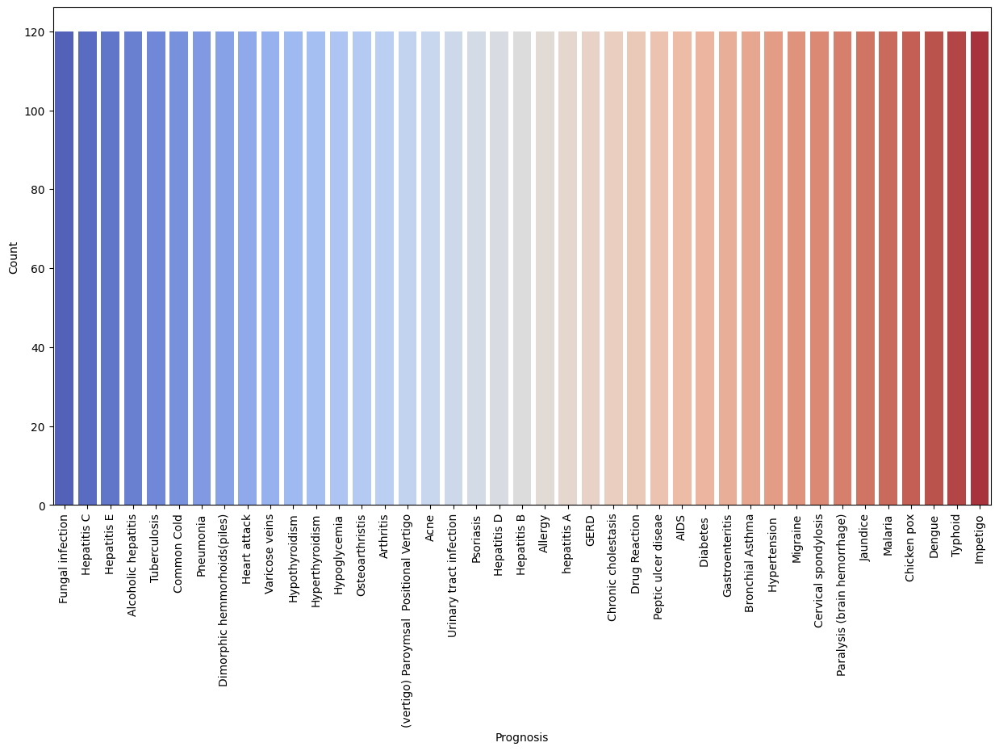

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

disease_counts = data_training['prognosis'].value_counts()

temp_dataframe = pd.DataFrame({
    'disease': disease_counts.index,
    'counts': disease_counts.values
})

palette = sns.color_palette("coolwarm", len(temp_dataframe))
plt.figure(figsize=(15,8))
sns.barplot(x="disease", y="counts", data=temp_dataframe, palette=palette)
plt.xticks(rotation=90)
plt.xlabel('Prognosis')
plt.ylabel('Count')
plt.show()


In [17]:
import plotly.express as px
fig=px.bar(data_training['prognosis'].value_counts(),
            x=data_training['prognosis'].value_counts().index,
            y=data_training['prognosis'].value_counts().values,
            labels={'x':'Prognosis','y':'Count'},
            title='Prognosis Counts'
            )
fig.show()

In [19]:
import plotly.express as px

fig = px.pie(data_training['prognosis'].value_counts(),
             names=data_training['prognosis'].value_counts().index,
             title='The Distribution of prognosis'
            )

# Update layout
fig.update_layout(
    hoverlabel=dict(bgcolor="white", font_size=15),
    height=500,
    width=1000
)

fig.show()


Ploting Percentage of Prognosis by Itching

In [20]:
import plotly.express as px
#calculate the percentage of each prognosis for each skin rash category
agg_prognosis_by_itching=data_training.groupby(['itching','prognosis'])['prognosis'].count().unstack()/len(data_training)*100

#create a stacked bar chart
fig=px.bar(agg_prognosis_by_itching,
           barmode='stack',
           labels={'value':'Percentage','prognosis': 'Prognosis'},
           title='Percentage of Prognosis by Itching'
           )
#update layout
fig.update_layout(
    xaxis_title='Itching',
    yaxis_title='Prognosis',
    legend_title='Prognosis',
    hovermode='x',
    hoverlabel=dict(bgcolor="white",font_size=12),
    height=600,
    width=800
)

fig.show()


In [ ]:
import plotly.express as px

column_name = input("Enter the name of the Symptom: ")

# calculate the percentage of each prognosis for each skin rash category
agg_prognosis_by = data_training.groupby([column_name, 'prognosis'])['prognosis'].count().unstack() / len(data_training) * 100

# create a stacked bar chart
fig = px.bar(agg_prognosis_by,
             barmode='stack',
             labels={'value': 'Percentage', 'prognosis': 'Prognosis'},
             title='Percentage of Prognosis by ' + column_name.title()
             )

# update layout
fig.update_layout(
    xaxis_title=column_name.title(),
    yaxis_title='Prognosis',
    legend_title='Prognosis',
    hovermode='x',
    hoverlabel=dict(bgcolor="white", font_size=12),
    height=600,
    width=800
)

fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Prompt the user to enter the diagnosis of interest
chosen_diagnosis = input("Enter the name of the diagnosis you're interested in: ")

# Filter the dataset for the chosen diagnosis
diagnosis_data = data_testing[data_testing['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_testing.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency': f'Frequency of Symptom {chosen_diagnosis}', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()


Enter the name of the diagnosis you're interested in: Allergy


In [ ]:
import pandas as pd
import plotly.express as px

# Prompt the user to enter the diagnosis of interest
chosen_diagnosis = input("Enter the name of the diagnosis you're interested in: ")

# Filter the dataset for the chosen diagnosis
diagnosis_data = data_training[data_training['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_training.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency': f'Frequency of Symptom {chosen_diagnosis}', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()


Enter the name of the diagnosis you're interested in: Allergy


In [ ]:
import plotly.express as px
#calculate the percentage of each prognosis for each skin rash category
agg_prognosis_by_itching=data_training.groupby(['itching','prognosis'])['prognosis'].count().unstack()/len(data_training)*100

#create a stacked bar chart
fig=px.bar(agg_prognosis_by_itching,
           barmode='stack',
           labels={'value':'Percentage','prognosis': 'Prognosis'},
           title='Percentage of Prognosis by Itching'
           )
#update layout
fig.update_layout(
    xaxis_title='Itching',
    yaxis_title='Prognosis',
    legend_title='Prognosis',
    hovermode='x',
    hoverlabel=dict(bgcolor="white",font_size=12),
    height=600,
    width=800
)

fig.show()


In [ ]:
import plotly.express as px
#calculate the percentage of each prognosis for each skin rash category
agg_prognosis_by_skin_rash=data_training.groupby(['skin_rash','prognosis'])['prognosis'].count().unstack()/len(data_training)*100

#create a stacked bar chart
fig=px.bar(agg_prognosis_by_skin_rash,
           barmode='stack',
           labels={'value':'Percentage','prognosis': 'Prognosis'},
           title='Percentage of Prognosis by skin_rash'
           )
#update layout
fig.update_layout(
    xaxis_title='skin_rash',
    yaxis_title='Prognosis',
    legend_title='Prognosis',
    hovermode='x',
    hoverlabel=dict(bgcolor="white",font_size=12),
    height=600,
    width=800
)

fig.show()

In [ ]:
import plotly.express as px
#calculate the percentage of each prognosis for each skin rash category
agg_prognosis_by_nodal_skin_eruptions=data_training.groupby(['nodal_skin_eruptions','prognosis'])['prognosis'].count().unstack()/len(data_training)*100

#create a stacked bar chart
fig=px.bar(agg_prognosis_by_nodal_skin_eruptions,
           barmode='stack',
           labels={'value':'Percentage','prognosis': 'Prognosis'},
           title='Percentage of Prognosis by nodal_skin_eruptions'
           )
#update layout
fig.update_layout(
    xaxis_title='nodal_skin_eruptions',
    yaxis_title='Prognosis',
    legend_title='Prognosis',
    hovermode='x',
    hoverlabel=dict(bgcolor="white",font_size=12),
    height=600,
    width=800
)

fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Choose the diagnosis you're interested in
chosen_diagnosis = "Fungal Infection"

# Filter the dataset for the chosen prognosis
diagnosis_data = data_testing[data_testing['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_testing.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency':'Frequency of Symptom Fungal Infection', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Choose the diagnosis you're interested in
chosen_diagnosis = "Fungal infection"

# Filter the dataset for the chosen prognosis
diagnosis_data = data_training[data_training['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_training.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency':'Frequency of Symptom Fugal Infection', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Choose the diagnosis you're interested in
chosen_diagnosis = "Allergy"

# Filter the dataset for the chosen prognosis
diagnosis_data = data_testing[data_testing['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_testing.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency':'Frequency of Symptom Allergy', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Choose the diagnosis you're interested in
chosen_diagnosis = "Allergy"

# Filter the dataset for the chosen prognosis
diagnosis_data = data_training[data_training['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_training.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency':'Frequency of Symptom Allergy', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Choose the diagnosis you're interested in
chosen_diagnosis = "GERD"

# Filter the dataset for the chosen prognosis
diagnosis_data = data_testing[data_testing['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_testing.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency':'Frequency of Symptom GERD', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Choose the diagnosis you're interested in
chosen_diagnosis = "GERD"

# Filter the dataset for the chosen prognosis
diagnosis_data = data_training[data_training['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_training.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency':'Frequency of Symptom GERD', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Choose the diagnosis you're interested in
chosen_diagnosis = "Chronic cholestasis"

# Filter the dataset for the chosen prognosis
diagnosis_data = data_testing[data_testing['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_testing.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency':'Frequency of Symptom Chronic cholestasis', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Choose the diagnosis you're interested in
chosen_diagnosis = "Chronic cholestasis"

# Filter the dataset for the chosen prognosis
diagnosis_data = data_training[data_training['prognosis'] == chosen_diagnosis]

# Exclude the prognosis column to focus on symptoms
symptom_columns = data_training.columns[:-1]

# Calculate the mean of each symptom column for the chosen diagnosis
# This represents the probability of each symptom occurring in the diagnosis
symptom_means = diagnosis_data[symptom_columns].mean().sort_values(ascending=False).reset_index()
symptom_means.columns = ['Symptom', 'Frequency']

# Plotting the bar chart with Plotly Express
fig = px.bar(symptom_means, x='Frequency', y='Symptom', orientation='h',
             title=f'Symptom Frequency for {chosen_diagnosis}',
             labels={'Frequency':'Frequency of Symptom Chronic cholestasis', 'Symptom': 'Symptoms'},
             color='Frequency',
             color_continuous_scale='magma')

fig.show()

Ploting heatmap to visualize the correlation matrix of a numerical DataFrame named data_training_numerical


In [ ]:

# Compute correlation matrix
corr_matrix = data_training_numerical.corr()

# Create a heatmap of the correlation matrix
# Adjusted the figure size to be more practical for viewing
plt.figure(figsize=(90, 100))
sns.heatmap(corr_matrix, annot=True, cmap="viridis", fmt=".2f")


plt.title("Correlation Heatmap")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()
